# Introduction

In this notebook, we continue the viz analysis from Q1.2 with Folium and changed the clustering viz analysis with marker analysis. We break the viz down to different boroughs for readability. We also re-org the table to get the top 20 buildings with the most evictions happened on average per year during 2017 - 2024. 

Further analysis will continue in the same series notebooks until clustering analysis and getting to know the data is done.

In [ ]:
# !pip install geopandas folium matplotlib seaborn scipy
# !pip install esda
# !pip install splot
# # for google colab, had to reinstall some pacakges.

In [ ]:
# !pip install geopandas folium matplotlib seaborn scipy esda splot

In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
import datetime as dt
import scipy

from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# visualization
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
import seaborn as sns
import folium
from folium.plugins import HeatMap
from folium import Marker
from folium.plugins import MarkerCluster
import plotly.express as px
import plotly.io as pio

# spatial statistics
from esda.moran import Moran
from esda.getisord import G_Local
from libpysal.weights import Queen, Rook

# system and utility
import warnings
import os
import io
from IPython.display import IFrame
from google.colab import files

from libpysal.weights import Queen, Rook
from esda.moran import Moran
import matplotlib.pyplot as plt
from splot.esda import moran_scatterplot

# suppress warnings
warnings.filterwarnings('ignore')

# inline
%matplotlib inline

# Part 1 Get the Eviction data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# data source:
file_path = '/content/drive/My Drive/X999/evictions_df_cleaned.csv'

In [ ]:
evictions_df_raw = pd.read_csv(file_path)

In [ ]:
evictions_df = evictions_df_raw.copy()

In [ ]:
evictions_df.head(2)

,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,borough,eviction_postcode,ejectment,eviction/legal_possession,latitude,longitude,community_board,council_district,census_tract,bin,bbl,nta
0,*313639/23,5202,710 61ST STREET,2ND FLOOR,2024-03-04,BROOKLYN,11220,Not an Ejectment,Possession,40.635941,-74.011883,7.0,38.0,118.0,3143881.0,3.057940e+09,Sunset Park East
1,*324973/22,5308,462 60TH STREET,FOURTH FLOOR APT AKA,2024-08-13,BROOKLYN,11220,Not an Ejectment,Possession,40.640008,-74.017068,7.0,38.0,122.0,3143435.0,3.057820e+09,Sunset Park West


In [ ]:
evictions_df.columns, \
evictions_df.shape

(Index(['court_index_number', 'docket_number', 'eviction_address',
        'eviction_apartment_number', 'executed_date', 'borough',
        'eviction_postcode', 'ejectment', 'eviction/legal_possession',
        'latitude', 'longitude', 'community_board', 'council_district',
        'census_tract', 'bin', 'bbl', 'nta'],
       dtype='object'),
 (76484, 17))

In [ ]:
evictions_df.executed_date = pd.to_datetime(evictions_df.executed_date)

In [ ]:
evictions_df.executed_date.min(), evictions_df.executed_date.max()

(Timestamp('2017-01-03 00:00:00'), Timestamp('2024-09-16 00:00:00'))

# Part 2 Get to know the GeoDataFrame

#### To properly understand the geo features and find hot spots in this evcition datasets, we need to utilize the GeoDataFrame to see if there is any interesting patterns that could be attributed to Societal trends/Predatory landlord bahaviors/corporate landlord behaviors

In [ ]:
# first, we create a GeoDataFrame
evictions_gdf = gpd.GeoDataFrame(
    evictions_df,
    geometry=gpd.points_from_xy(evictions_df['longitude'], evictions_df['latitude']))

In [ ]:
evictions_gdf.head(2)

,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,borough,eviction_postcode,ejectment,eviction/legal_possession,latitude,longitude,community_board,council_district,census_tract,bin,bbl,nta,geometry
0,*313639/23,5202,710 61ST STREET,2ND FLOOR,2024-03-04,BROOKLYN,11220,Not an Ejectment,Possession,40.635941,-74.011883,7.0,38.0,118.0,3143881.0,3.057940e+09,Sunset Park East,POINT (-74.01188 40.63594)
1,*324973/22,5308,462 60TH STREET,FOURTH FLOOR APT AKA,2024-08-13,BROOKLYN,11220,Not an Ejectment,Possession,40.640008,-74.017068,7.0,38.0,122.0,3143435.0,3.057820e+09,Sunset Park West,POINT (-74.01707 40.64001)


In [ ]:
evictions_cleaned = evictions_gdf.dropna(subset=['latitude', 'longitude'])
evictions_cleaned = evictions_cleaned.reset_index(drop=True)

In [ ]:
evictions_cleaned.columns

Index(['court_index_number', 'docket_number', 'eviction_address',
       'eviction_apartment_number', 'executed_date', 'borough',
       'eviction_postcode', 'ejectment', 'eviction/legal_possession',
       'latitude', 'longitude', 'community_board', 'council_district',
       'census_tract', 'bin', 'bbl', 'nta', 'geometry'],
      dtype='object')

### Part 2.1: Aggregation to find eviction counts (with BBL)

#### Aggregate by BBL:

BBL appears to be the most sensible basic unit here, as other ones: apartment unit, neighborhood, zipcode, and borough would either be too small (non-representable) or too large to understand landlord behaviors.

In [ ]:
# groupby
evictions_by_bbl = evictions_cleaned.groupby('bbl').size().reset_index(name='eviction_count')
# merge
evictions_cleaned = evictions_cleaned.merge(evictions_by_bbl, on='bbl', how='left')

In [ ]:
evictions_cleaned.columns
# eviction_count added

Index(['court_index_number', 'docket_number', 'eviction_address',
       'eviction_apartment_number', 'executed_date', 'borough',
       'eviction_postcode', 'ejectment', 'eviction/legal_possession',
       'latitude', 'longitude', 'community_board', 'council_district',
       'census_tract', 'bin', 'bbl', 'nta', 'geometry', 'eviction_count'],
      dtype='object')

In [ ]:
# normalize the eviction counts by year and get the average counts:
evictions_cleaned['year'] = evictions_cleaned['executed_date'].dt.year  # Extract year from executed_date
eviction_counts = evictions_cleaned.groupby(['bbl', 'year']).size().reset_index(name='eviction_count')
yearly_avg_evictions = eviction_counts.groupby('bbl')['eviction_count'].mean().reset_index(name='average_year_eviction_count')

In [ ]:
# merge
evictions_cleaned = evictions_cleaned.merge(yearly_avg_evictions, on='bbl', how='left')

In [ ]:
evictions_cleaned.columns
# average_year_eviction_count added

Index(['court_index_number', 'docket_number', 'eviction_address',
       'eviction_apartment_number', 'executed_date', 'borough',
       'eviction_postcode', 'ejectment', 'eviction/legal_possession',
       'latitude', 'longitude', 'community_board', 'council_district',
       'census_tract', 'bin', 'bbl', 'nta', 'geometry', 'eviction_count',
       'year', 'average_year_eviction_count'],
      dtype='object')

In [ ]:
evictions_cleaned.head(2)

,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,borough,eviction_postcode,ejectment,eviction/legal_possession,latitude,...,community_board,council_district,census_tract,bin,bbl,nta,geometry,eviction_count,year,average_year_eviction_count
0,*313639/23,5202,710 61ST STREET,2ND FLOOR,2024-03-04,BROOKLYN,11220,Not an Ejectment,Possession,40.635941,...,7.0,38.0,118.0,3143881.0,3.057940e+09,Sunset Park East,POINT (-74.01188 40.63594),3,2024,3.0
1,*324973/22,5308,462 60TH STREET,FOURTH FLOOR APT AKA,2024-08-13,BROOKLYN,11220,Not an Ejectment,Possession,40.640008,...,7.0,38.0,122.0,3143435.0,3.057820e+09,Sunset Park West,POINT (-74.01707 40.64001),3,2024,3.0


### Part 2.2 Visualize the GeoDataFrame -- Plotly and Folium

#### Plotly first:

#### in Q1.1

In [ ]:
evictions_cleaned['borough'].unique()

array(['BROOKLYN', 'BRONX', 'STATEN ISLAND', 'QUEENS', 'MANHATTAN'],
      dtype=object)

In [ ]:
# manhattan
evictions_manhattan = evictions_cleaned[evictions_cleaned['borough'] == 'MANHATTAN']
evictions_manhattan.shape, \
# evictions_manhattan.head(2)
# evictions_cleaned['borough'].unique()

((11570, 21),)

In [ ]:
evictions_bronx = evictions_cleaned[evictions_cleaned['borough'] == 'BRONX']
evictions_bronx.shape

(26659, 21)

In [ ]:
# staten island
evictions_staten_island = evictions_cleaned[evictions_cleaned['borough'] == 'STATEN ISLAND']
evictions_staten_island.shape

(2590, 21)

In [42]:
# Queens
evictions_queens = evictions_cleaned[evictions_cleaned['borough'] == 'QUEENS']
evictions_queens.shape

(13481, 21)

In [43]:
# Brooklyn
evictions_brooklyn = evictions_cleaned[evictions_cleaned['borough'] == 'BROOKLYN']
evictions_brooklyn.shape

(22184, 21)

In [ ]:
# save as an interactive HTML file
# pio.write_html(fig, file='evictions_map.html', auto_open=False)

#### Short summaries:  
- What Plotly shows here is that certain buildings have more evictions than others. Most buildings have fewer than 5 evictions per year, but a few of them have more than 20 evictions per year on average during the year 2017 to 2024.


### Folium:

#### as in plotly, we break the viz down in different boroughs

In [ ]:
# # use folium heatmap to show the data in a better visualization
# ## problem1: the aurora around each dot is too strong
# ## problem2: the dots are inside each street, instead of on the exact location of the buildings
# # nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
# # # only focus on manhattan
# # heat_data = [[row['latitude'], row['longitude'], row['average_year_eviction_count']] for index, row in evictions_manhattan.iterrows()]
# # HeatMap(heat_data, radius=10).add_to(nyc_map)

# # nyc_map

# ## make it align with the buildings, instead of the roads.
# ## what happens if we don't use the clustering  ----> cluster marker

# # nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
# # # Only focus on Manhattan
# # heat_data = [[row['latitude'], row['longitude'], row['average_year_eviction_count']] for index, row in evictions_manhattan.iterrows()]
# # HeatMap(heat_data, radius=5, blur=3).add_to(nyc_map)

# # nyc_map


# manhattan
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
marker_cluster = MarkerCluster().add_to(nyc_map)

for index, row in evictions_manhattan.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,  # smaller radius for pinpoint locations
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(marker_cluster)

nyc_map

Saving cluster_map_manhattan.png to cluster_map_manhattan.png


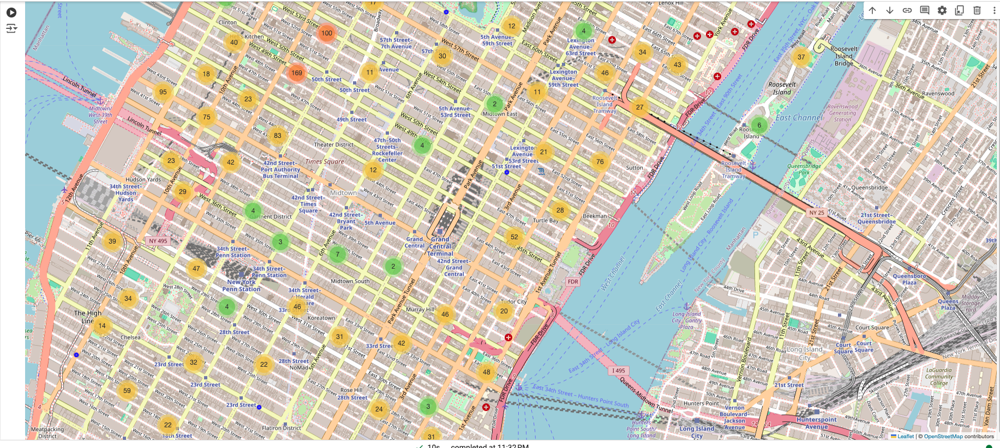

In [ ]:
# in case it does not load, it is as shown below
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='cluster_map_manhattan.png')

Saving cluster_map_manhattan_street1.png to cluster_map_manhattan_street1.png


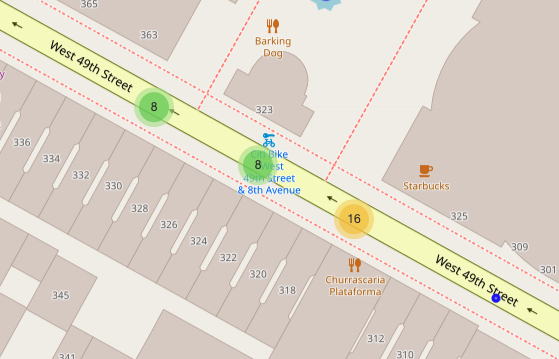

In [ ]:
# This shows a very specific portion of the map, so readers can understand what each number means.
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='cluster_map_manhattan_street1.png')

Saving cluster_map_manhattan_street2.png to cluster_map_manhattan_street2.png


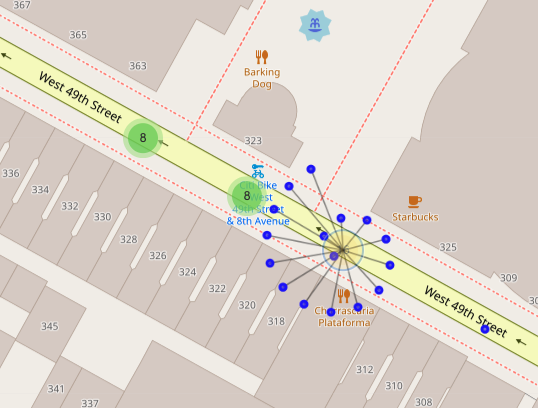

In [ ]:
# this shows how each number was calculated
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='cluster_map_manhattan_street2.png')

In [41]:
# bronx
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
marker_cluster = MarkerCluster().add_to(nyc_map)

for index, row in evictions_bronx.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,  # smaller radius for pinpoint locations
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(marker_cluster)

nyc_map

Saving cluster_map_bronx.png to cluster_map_bronx.png


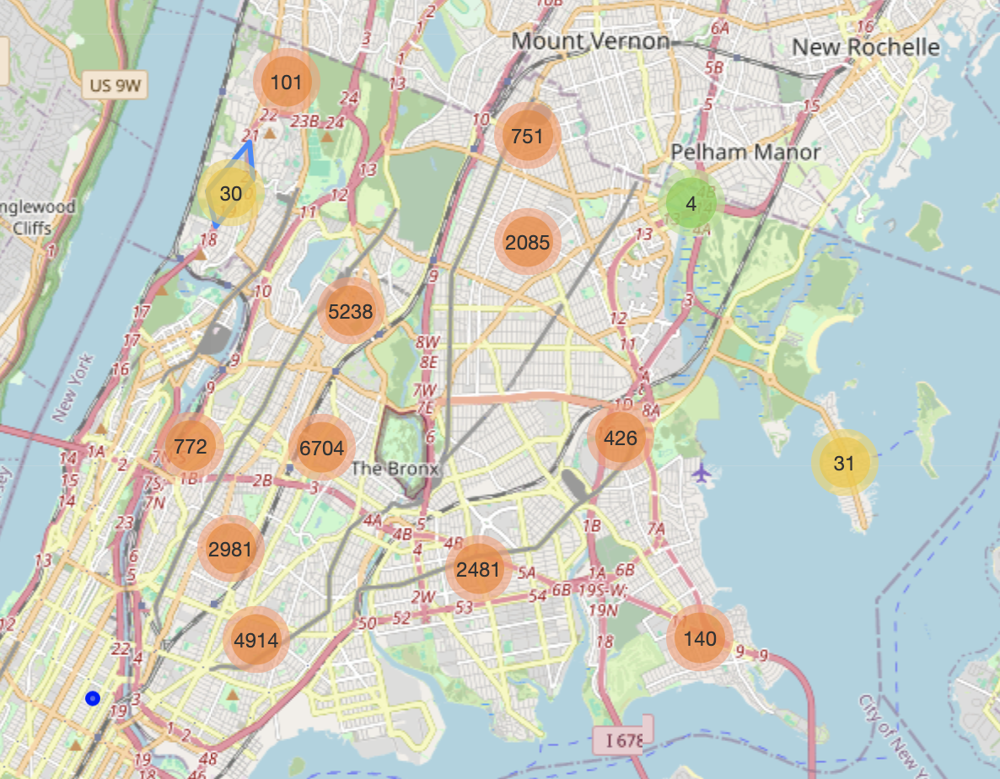

In [ ]:
# bronx
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='cluster_map_bronx.png')

Saving cluster_map_bronx_street1.png to cluster_map_bronx_street1.png


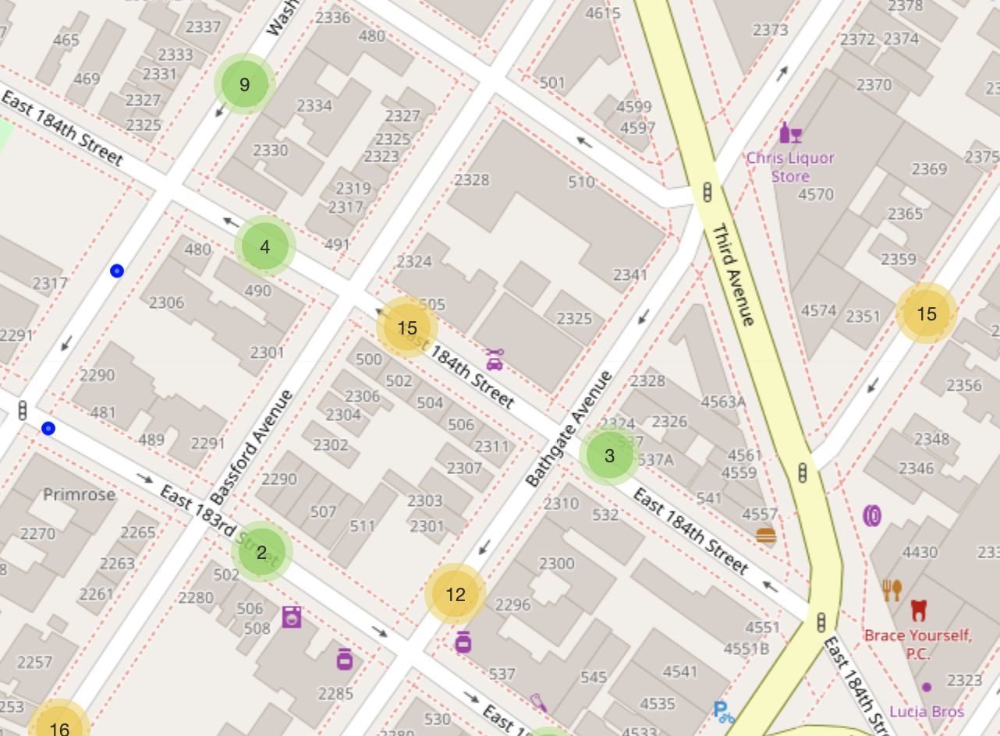

In [39]:
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='cluster_map_bronx_street1.png')

Saving cluster_map_bronx_street2.png to cluster_map_bronx_street2.png


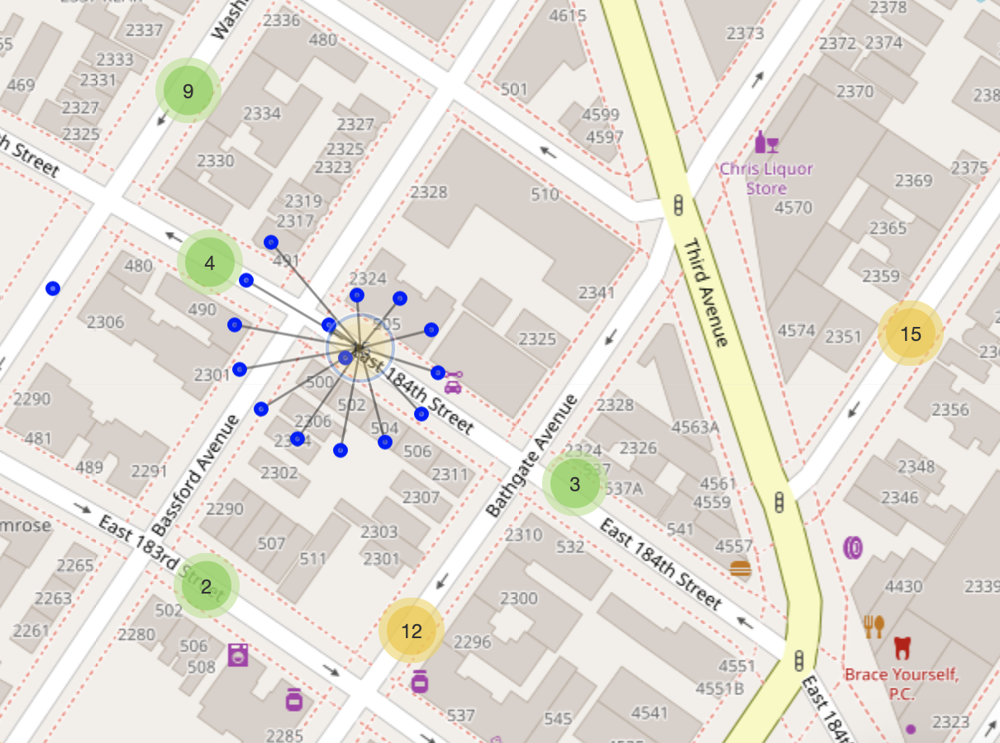

In [40]:
# this shows how each number was calculated
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='cluster_map_bronx_street2.png')

In [45]:
# brooklyn
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
marker_cluster = MarkerCluster().add_to(nyc_map)

for index, row in evictions_brooklyn.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,  # smaller radius for pinpoint locations
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(marker_cluster)

nyc_map

Saving cluster_map_brooklyn.png to cluster_map_brooklyn.png


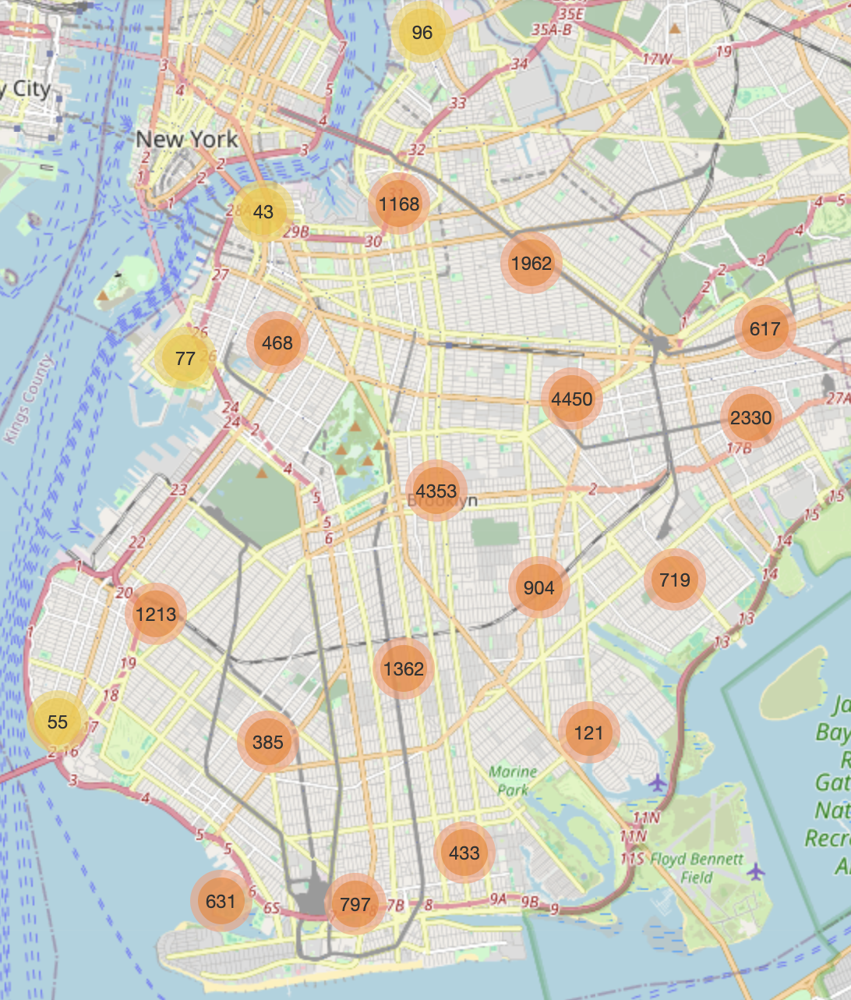

In [46]:
# brooklyn
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='cluster_map_brooklyn.png')

In [52]:
# queens
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
marker_cluster = MarkerCluster().add_to(nyc_map)

for index, row in evictions_queens.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,  # smaller radius for pinpoint locations
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(marker_cluster)

nyc_map

Saving cluster_map_queens.png to cluster_map_queens.png


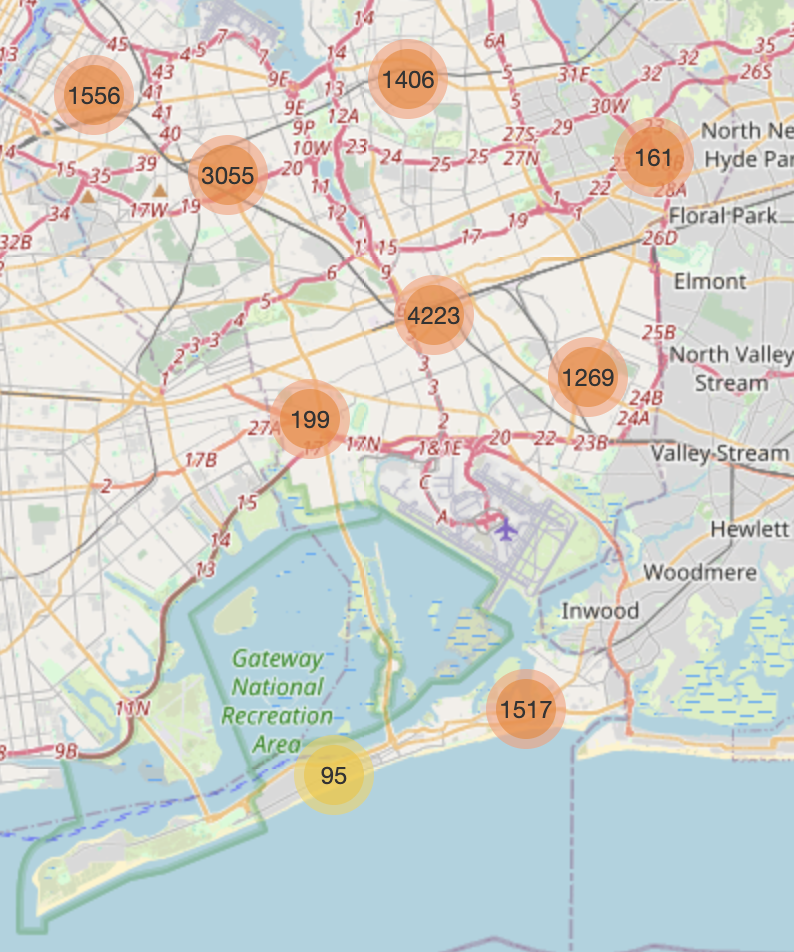

In [48]:
# queens
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='cluster_map_queens.png')

In [53]:
# staten island
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
marker_cluster = MarkerCluster().add_to(nyc_map)

for index, row in evictions_staten_island.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,  # smaller radius for pinpoint locations
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(marker_cluster)

nyc_map

Saving cluster_map_staten_island.png to cluster_map_staten_island.png


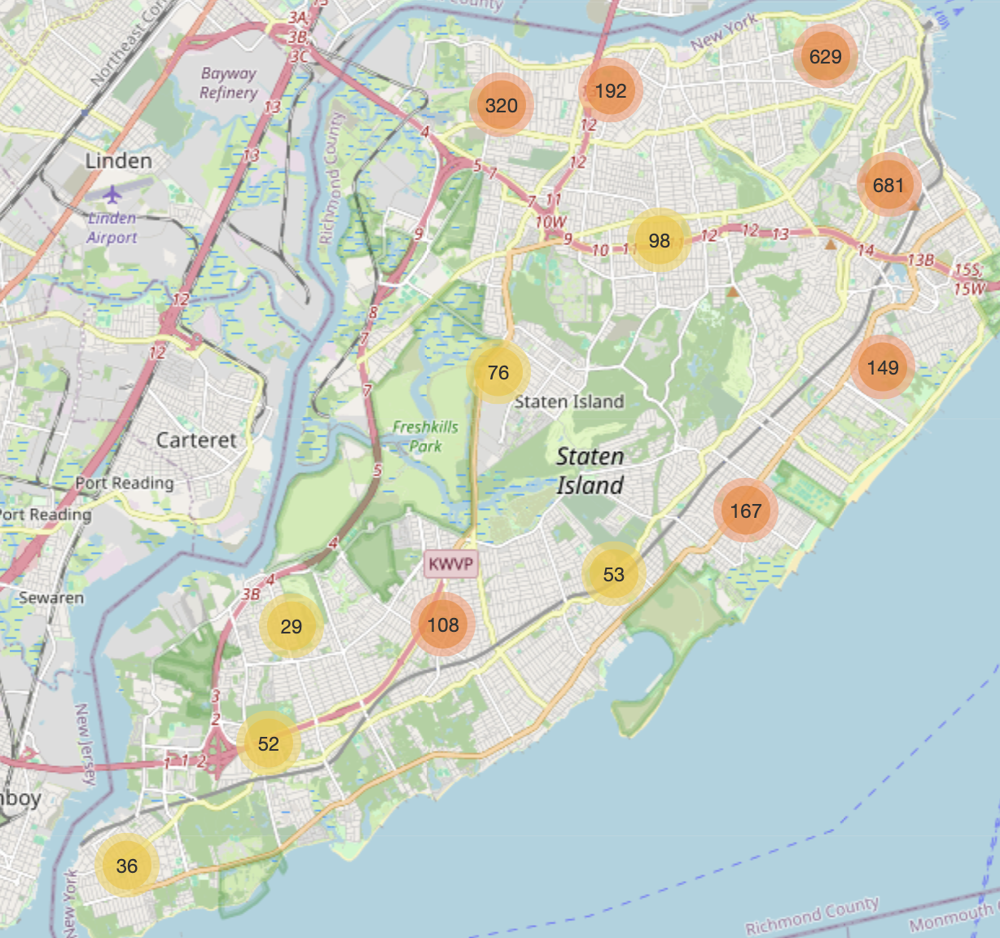

In [51]:
# staten island
from google.colab import files
from IPython.display import Image
uploaded = files.upload()
Image(filename='cluster_map_staten_island.png')

#### Short summaries:
- Folium heatmap gives the same conclusion: most buildings have very few evictions per year, usually 1, with a little more than a dozen buildings have more than 10 evictions per year. However, Folium map shows better details of the streets and neighborhoods.

# Part 3 Clustering

In [ ]:
# evictions_cleaned.columns
## didn't change

In [54]:
# the number of unique building codes is 34032 in this dataset
len(evictions_cleaned.bbl.unique())

34032

In [55]:
evictions_cleaned.shape
# as expected, there are repeatitive bbl with evictions over the years

(76484, 21)

## Part 3.1 Buildings with the most evictions (top_bbls)

In [56]:
# sort by eviction_count and extract the top 10 records based on the average_year_eviction_count column
top_bbls = evictions_cleaned[['bbl', 'average_year_eviction_count']].groupby('bbl').mean().sort_values(by='average_year_eviction_count', ascending=False)
top_bbls.shape

(34032, 1)

In [57]:
top_bbls.head(10)

,average_year_eviction_count
bbl,
2.028820e+09,36.285714
2.051410e+09,27.428571
4.124950e+09,25.428571
4.159260e+09,23.000000
2.039448e+09,22.714286
2.039438e+09,18.714286
2.049050e+09,16.333333
3.042719e+09,14.571429
1.003560e+09,14.333333


In [58]:
bbls_over_10_evictions = top_bbls[top_bbls['average_year_eviction_count'] > 10]
bbls_over_10_evictions.shape
# 18 buildings have eviction counts larger than 10 per year on average

(18, 1)

### TODO:
### Some potential research questions/hypothesis include:
    - look into each of these buildings and check who the landlords are.
    - are they individual landlord or corporate landlords?
    - do they habitually exbihit such behavior?
    - is there a reason for the evictions besides the tenants' behavior?
    - is this related to building policy changes?
    - is this related to city-wide/neighborhood-wide changes?
### Another dataset we will be using: BBL.csv
    - pull the info of the buildings from bbl
    - since there are only 18 of them, we can have a closer look at them and then get a writeup of the landlords' background.

In [59]:
# show all 18 of them

bbls_over_10_evictions

,average_year_eviction_count
bbl,
2.028820e+09,36.285714
2.051410e+09,27.428571
4.124950e+09,25.428571
4.159260e+09,23.000000
2.039448e+09,22.714286
2.039438e+09,18.714286
2.049050e+09,16.333333
3.042719e+09,14.571429
1.003560e+09,14.333333


In [60]:
evictions_cleaned.head(2)

,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,borough,eviction_postcode,ejectment,eviction/legal_possession,latitude,...,community_board,council_district,census_tract,bin,bbl,nta,geometry,eviction_count,year,average_year_eviction_count
0,*313639/23,5202,710 61ST STREET,2ND FLOOR,2024-03-04,BROOKLYN,11220,Not an Ejectment,Possession,40.635941,...,7.0,38.0,118.0,3143881.0,3.057940e+09,Sunset Park East,POINT (-74.01188 40.63594),3,2024,3.0
1,*324973/22,5308,462 60TH STREET,FOURTH FLOOR APT AKA,2024-08-13,BROOKLYN,11220,Not an Ejectment,Possession,40.640008,...,7.0,38.0,122.0,3143435.0,3.057820e+09,Sunset Park West,POINT (-74.01707 40.64001),3,2024,3.0


In [ ]:
# evictions_cleaned.columns
## no change

#### The rest of the analysis will be broken down into different notebooks